# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

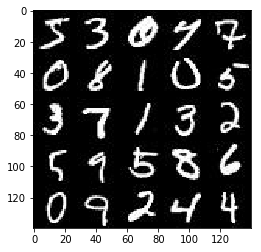

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

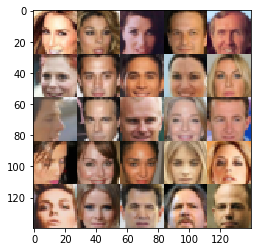

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.1.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [73]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="real_inputs")
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name="z_inputs")
    learning_rate = tf.placeholder(tf.float32, (None), name="learning_rate")

    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [75]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function

    with tf.variable_scope("discriminator", reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 4, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(x1, training=True)
        relu1 = tf.maximum(alpha * bn1, bn1)
        
        x2 = tf.layers.conv2d(relu1, 128, 4, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        
        x3 = tf.layers.conv2d(relu2, 256, 4, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [76]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope("generator", reuse=not is_train):
        x1 = tf.layers.dense(z, 4*4*512)
        
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=2, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 4, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 4, strides=2, padding='same')
        logits = tf.image.resize_images(logits, [28,28])
        out = tf.tanh(logits)

        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [77]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [78]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [79]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    
    sample_z = np.random.uniform(-1, 1, size=z_dim)
    
    samples, losses = [], []
    steps = 0
    
    inputs_real, inputs_z, learning_rt = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, learning_rt: learning_rate})
                _ = sess.run(g_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, learning_rt: learning_rate})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({inputs_real: batch_images, inputs_z: batch_z})
                    train_loss_g = g_loss.eval({inputs_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    
                    losses.append((train_loss_d, train_loss_g))
                
                if steps % 30 == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)
                
        saver.save(sess, './checkpoints/generator.ckpt')
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0/2... Discriminator Loss: 2.2228... Generator Loss: 0.1878
Epoch 0/2... Discriminator Loss: 1.3162... Generator Loss: 0.4350
Epoch 0/2... Discriminator Loss: 1.9908... Generator Loss: 0.2021


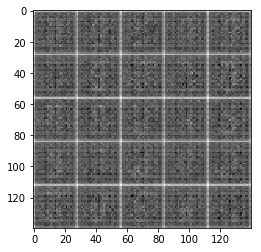

Epoch 0/2... Discriminator Loss: 2.4332... Generator Loss: 0.1300
Epoch 0/2... Discriminator Loss: 1.7785... Generator Loss: 0.2911
Epoch 0/2... Discriminator Loss: 1.6542... Generator Loss: 0.3327


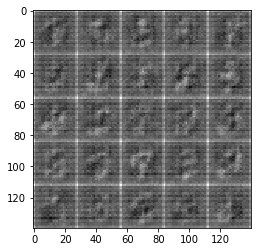

Epoch 0/2... Discriminator Loss: 1.7037... Generator Loss: 0.2859
Epoch 0/2... Discriminator Loss: 1.3360... Generator Loss: 0.4883
Epoch 0/2... Discriminator Loss: 1.5048... Generator Loss: 0.3109


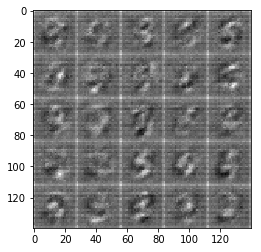

Epoch 0/2... Discriminator Loss: 1.3813... Generator Loss: 0.3903
Epoch 0/2... Discriminator Loss: 1.3444... Generator Loss: 0.3752
Epoch 0/2... Discriminator Loss: 1.2431... Generator Loss: 0.4638


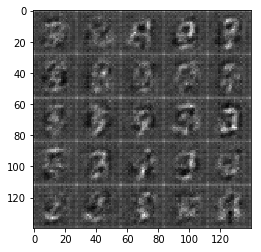

Epoch 0/2... Discriminator Loss: 1.0007... Generator Loss: 0.6521
Epoch 0/2... Discriminator Loss: 1.2639... Generator Loss: 0.3919
Epoch 0/2... Discriminator Loss: 1.3805... Generator Loss: 0.3844


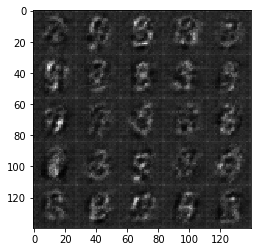

Epoch 0/2... Discriminator Loss: 0.9461... Generator Loss: 0.6613
Epoch 0/2... Discriminator Loss: 0.8913... Generator Loss: 2.3801
Epoch 0/2... Discriminator Loss: 0.6964... Generator Loss: 1.6846


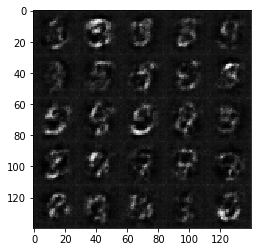

Epoch 0/2... Discriminator Loss: 0.6245... Generator Loss: 1.9725
Epoch 0/2... Discriminator Loss: 0.9237... Generator Loss: 3.0390
Epoch 0/2... Discriminator Loss: 0.8794... Generator Loss: 3.2142


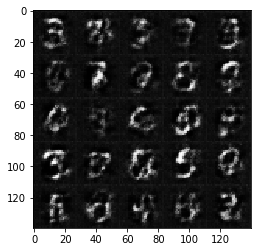

Epoch 0/2... Discriminator Loss: 0.5424... Generator Loss: 2.1823
Epoch 0/2... Discriminator Loss: 0.5665... Generator Loss: 1.0753
Epoch 0/2... Discriminator Loss: 1.1122... Generator Loss: 0.4614


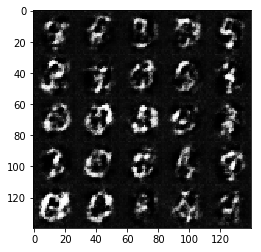

Epoch 0/2... Discriminator Loss: 0.3145... Generator Loss: 1.8062
Epoch 0/2... Discriminator Loss: 0.3382... Generator Loss: 1.6940
Epoch 0/2... Discriminator Loss: 2.1653... Generator Loss: 0.1486


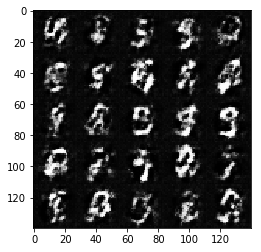

Epoch 0/2... Discriminator Loss: 0.3494... Generator Loss: 1.6702
Epoch 0/2... Discriminator Loss: 0.3311... Generator Loss: 1.6668
Epoch 0/2... Discriminator Loss: 0.2437... Generator Loss: 1.9923


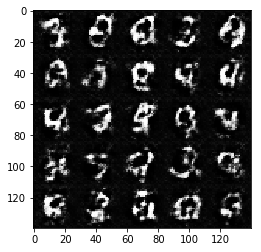

Epoch 0/2... Discriminator Loss: 0.2525... Generator Loss: 1.9139
Epoch 0/2... Discriminator Loss: 0.2773... Generator Loss: 1.7472
Epoch 0/2... Discriminator Loss: 0.1824... Generator Loss: 2.2820


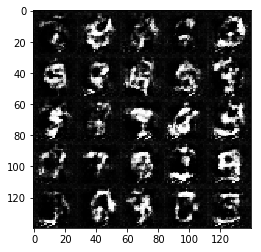

Epoch 0/2... Discriminator Loss: 0.1381... Generator Loss: 2.6746
Epoch 0/2... Discriminator Loss: 0.1587... Generator Loss: 2.6098
Epoch 0/2... Discriminator Loss: 0.1285... Generator Loss: 2.5521


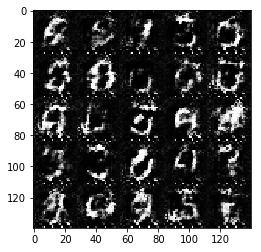

Epoch 0/2... Discriminator Loss: 0.1179... Generator Loss: 2.6088
Epoch 0/2... Discriminator Loss: 0.0868... Generator Loss: 3.0717
Epoch 0/2... Discriminator Loss: 0.1186... Generator Loss: 2.6125


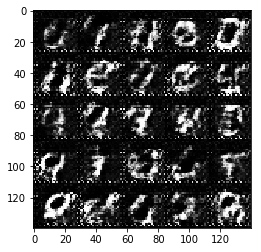

Epoch 0/2... Discriminator Loss: 0.0681... Generator Loss: 3.1247
Epoch 0/2... Discriminator Loss: 0.0897... Generator Loss: 2.8357
Epoch 0/2... Discriminator Loss: 0.0680... Generator Loss: 3.2136


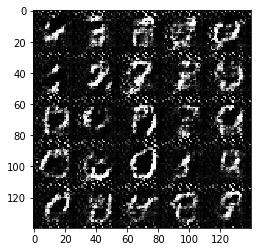

Epoch 0/2... Discriminator Loss: 0.0706... Generator Loss: 3.2319
Epoch 0/2... Discriminator Loss: 0.0827... Generator Loss: 3.0161
Epoch 0/2... Discriminator Loss: 0.1903... Generator Loss: 1.9799


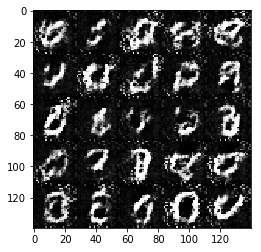

Epoch 0/2... Discriminator Loss: 1.6389... Generator Loss: 8.6412
Epoch 0/2... Discriminator Loss: 0.3194... Generator Loss: 1.6831
Epoch 0/2... Discriminator Loss: 0.2554... Generator Loss: 1.9750


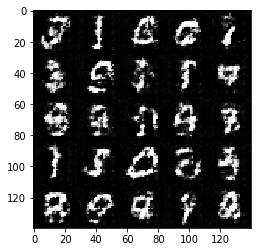

Epoch 0/2... Discriminator Loss: 0.1330... Generator Loss: 2.9698
Epoch 0/2... Discriminator Loss: 0.1149... Generator Loss: 2.9293
Epoch 0/2... Discriminator Loss: 0.1155... Generator Loss: 2.7053


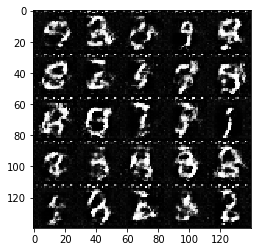

Epoch 0/2... Discriminator Loss: 0.0877... Generator Loss: 2.9808
Epoch 0/2... Discriminator Loss: 0.0825... Generator Loss: 3.8514
Epoch 0/2... Discriminator Loss: 0.0549... Generator Loss: 3.3117


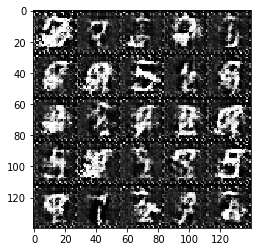

Epoch 0/2... Discriminator Loss: 0.0736... Generator Loss: 2.9674
Epoch 0/2... Discriminator Loss: 0.0412... Generator Loss: 3.6800
Epoch 0/2... Discriminator Loss: 0.0384... Generator Loss: 3.5986


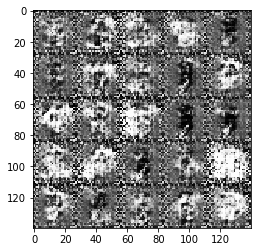

Epoch 0/2... Discriminator Loss: 0.0439... Generator Loss: 3.5768
Epoch 0/2... Discriminator Loss: 0.0168... Generator Loss: 4.4741
Epoch 0/2... Discriminator Loss: 0.0101... Generator Loss: 5.2227


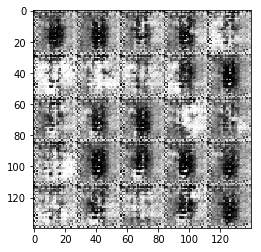

Epoch 0/2... Discriminator Loss: 0.0084... Generator Loss: 5.4837
Epoch 0/2... Discriminator Loss: 0.0116... Generator Loss: 5.2639
Epoch 0/2... Discriminator Loss: 0.0105... Generator Loss: 4.9667


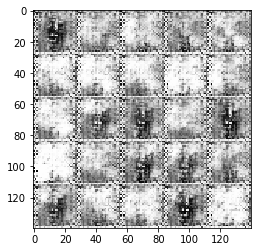

Epoch 0/2... Discriminator Loss: 0.0107... Generator Loss: 4.8639
Epoch 0/2... Discriminator Loss: 0.0107... Generator Loss: 4.8229
Epoch 0/2... Discriminator Loss: 0.0065... Generator Loss: 5.7840


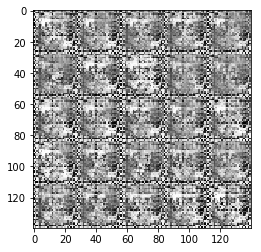

Epoch 0/2... Discriminator Loss: 0.0197... Generator Loss: 4.1722
Epoch 0/2... Discriminator Loss: 0.0113... Generator Loss: 5.2650
Epoch 0/2... Discriminator Loss: 0.0393... Generator Loss: 3.4062


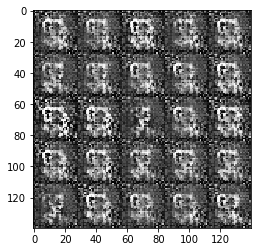

Epoch 0/2... Discriminator Loss: 0.0494... Generator Loss: 4.3041
Epoch 0/2... Discriminator Loss: 0.0299... Generator Loss: 4.5381
Epoch 0/2... Discriminator Loss: 0.6133... Generator Loss: 1.4119


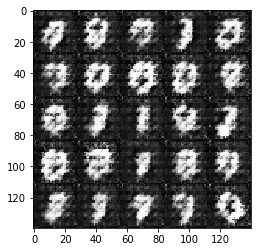

Epoch 0/2... Discriminator Loss: 0.2282... Generator Loss: 1.9452
Epoch 0/2... Discriminator Loss: 0.0673... Generator Loss: 3.3086
Epoch 0/2... Discriminator Loss: 0.1052... Generator Loss: 3.5542


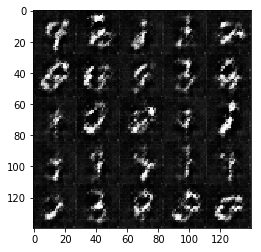

Epoch 0/2... Discriminator Loss: 0.0802... Generator Loss: 2.9897
Epoch 0/2... Discriminator Loss: 0.1071... Generator Loss: 3.4957
Epoch 0/2... Discriminator Loss: 0.8648... Generator Loss: 0.8093


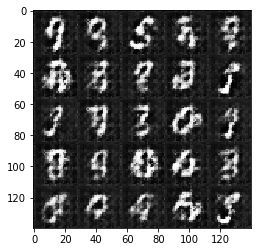

Epoch 0/2... Discriminator Loss: 3.0330... Generator Loss: 10.2923
Epoch 0/2... Discriminator Loss: 0.2233... Generator Loss: 2.1950
Epoch 0/2... Discriminator Loss: 0.1702... Generator Loss: 2.5206


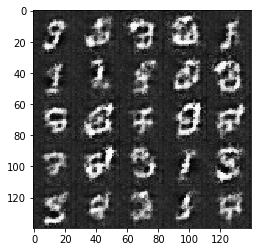

Epoch 0/2... Discriminator Loss: 1.3918... Generator Loss: 6.1331
Epoch 0/2... Discriminator Loss: 0.4658... Generator Loss: 1.1396
Epoch 0/2... Discriminator Loss: 0.7369... Generator Loss: 8.1115


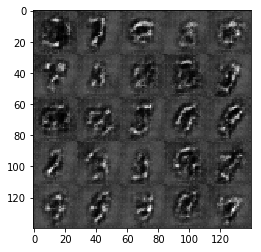

Epoch 0/2... Discriminator Loss: 1.1138... Generator Loss: 7.4098
Epoch 0/2... Discriminator Loss: 1.8922... Generator Loss: 0.2357
Epoch 0/2... Discriminator Loss: 1.5805... Generator Loss: 2.3566


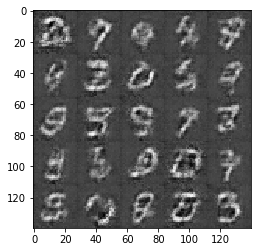

Epoch 0/2... Discriminator Loss: 0.3096... Generator Loss: 2.7088
Epoch 0/2... Discriminator Loss: 0.4380... Generator Loss: 1.3618
Epoch 0/2... Discriminator Loss: 0.2942... Generator Loss: 1.7046


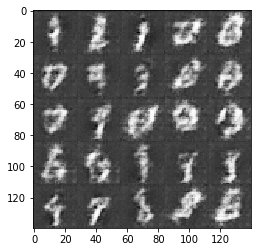

Epoch 0/2... Discriminator Loss: 0.5000... Generator Loss: 2.4509
Epoch 0/2... Discriminator Loss: 0.5408... Generator Loss: 1.1169
Epoch 0/2... Discriminator Loss: 0.1303... Generator Loss: 2.7813


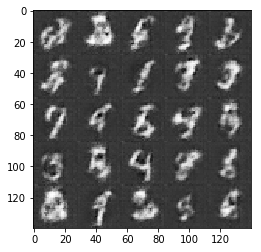

Epoch 1/2... Discriminator Loss: 0.1359... Generator Loss: 2.6126
Epoch 1/2... Discriminator Loss: 0.1487... Generator Loss: 2.9010
Epoch 1/2... Discriminator Loss: 0.6866... Generator Loss: 0.8447


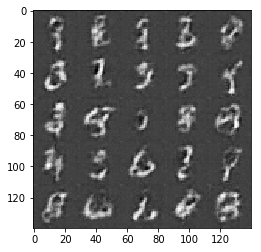

Epoch 1/2... Discriminator Loss: 0.9346... Generator Loss: 4.6646
Epoch 1/2... Discriminator Loss: 0.8050... Generator Loss: 0.6988
Epoch 1/2... Discriminator Loss: 1.2473... Generator Loss: 4.4582


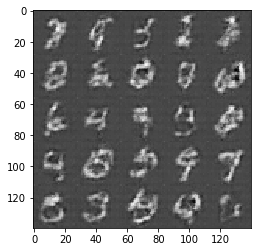

Epoch 1/2... Discriminator Loss: 0.4959... Generator Loss: 1.2247
Epoch 1/2... Discriminator Loss: 1.0285... Generator Loss: 0.5406
Epoch 1/2... Discriminator Loss: 0.1395... Generator Loss: 3.2567


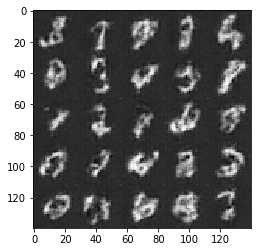

Epoch 1/2... Discriminator Loss: 0.1121... Generator Loss: 3.3365
Epoch 1/2... Discriminator Loss: 0.1089... Generator Loss: 3.2007
Epoch 1/2... Discriminator Loss: 0.0739... Generator Loss: 3.4015


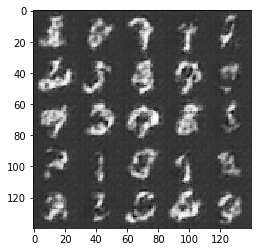

Epoch 1/2... Discriminator Loss: 0.0808... Generator Loss: 3.3914
Epoch 1/2... Discriminator Loss: 0.1361... Generator Loss: 3.4455
Epoch 1/2... Discriminator Loss: 0.0923... Generator Loss: 3.1903


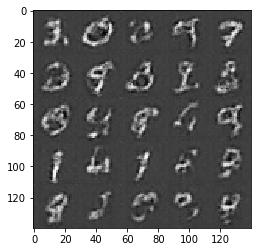

Epoch 1/2... Discriminator Loss: 0.0736... Generator Loss: 3.3656
Epoch 1/2... Discriminator Loss: 0.7725... Generator Loss: 1.1179
Epoch 1/2... Discriminator Loss: 0.5359... Generator Loss: 1.5884


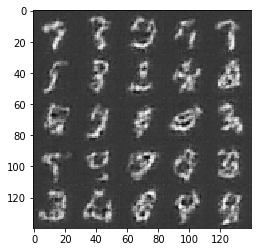

Epoch 1/2... Discriminator Loss: 0.8275... Generator Loss: 0.9103
Epoch 1/2... Discriminator Loss: 1.1548... Generator Loss: 0.4847
Epoch 1/2... Discriminator Loss: 0.5966... Generator Loss: 1.4887


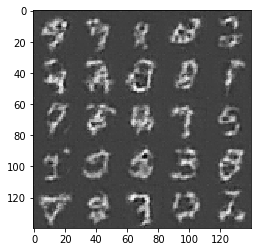

Epoch 1/2... Discriminator Loss: 0.7455... Generator Loss: 0.8307
Epoch 1/2... Discriminator Loss: 1.0840... Generator Loss: 0.5072
Epoch 1/2... Discriminator Loss: 0.4191... Generator Loss: 1.6978


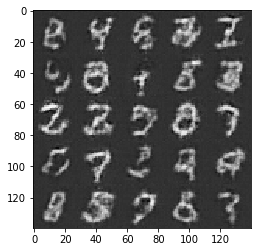

Epoch 1/2... Discriminator Loss: 0.7428... Generator Loss: 2.8380
Epoch 1/2... Discriminator Loss: 0.4512... Generator Loss: 1.5923
Epoch 1/2... Discriminator Loss: 0.4287... Generator Loss: 1.3721


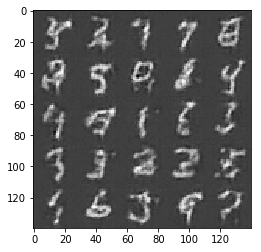

Epoch 1/2... Discriminator Loss: 0.4065... Generator Loss: 1.8262
Epoch 1/2... Discriminator Loss: 0.4981... Generator Loss: 2.6324
Epoch 1/2... Discriminator Loss: 0.6071... Generator Loss: 2.5227


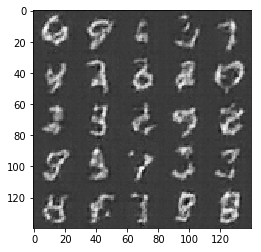

Epoch 1/2... Discriminator Loss: 0.4254... Generator Loss: 1.4357
Epoch 1/2... Discriminator Loss: 1.2232... Generator Loss: 3.9846
Epoch 1/2... Discriminator Loss: 0.3279... Generator Loss: 2.2075


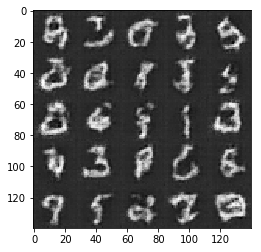

Epoch 1/2... Discriminator Loss: 0.2668... Generator Loss: 2.3171
Epoch 1/2... Discriminator Loss: 0.3364... Generator Loss: 1.6101
Epoch 1/2... Discriminator Loss: 0.1103... Generator Loss: 3.0254


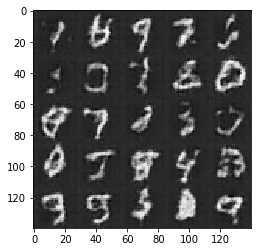

Epoch 1/2... Discriminator Loss: 0.6100... Generator Loss: 1.0089
Epoch 1/2... Discriminator Loss: 0.1053... Generator Loss: 2.8306
Epoch 1/2... Discriminator Loss: 0.9829... Generator Loss: 4.6405


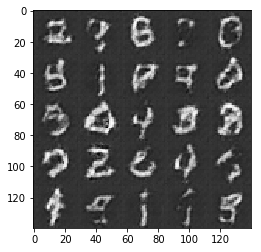

Epoch 1/2... Discriminator Loss: 0.7652... Generator Loss: 1.0605
Epoch 1/2... Discriminator Loss: 0.5707... Generator Loss: 1.8927
Epoch 1/2... Discriminator Loss: 1.0024... Generator Loss: 0.5503


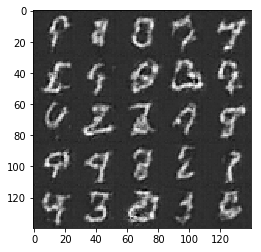

Epoch 1/2... Discriminator Loss: 0.4781... Generator Loss: 1.5011
Epoch 1/2... Discriminator Loss: 0.2920... Generator Loss: 1.9608
Epoch 1/2... Discriminator Loss: 0.1714... Generator Loss: 2.5566


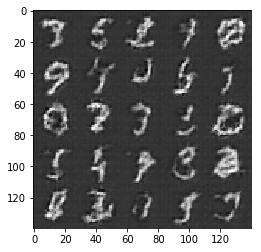

Epoch 1/2... Discriminator Loss: 0.1945... Generator Loss: 2.6450
Epoch 1/2... Discriminator Loss: 0.4785... Generator Loss: 1.8241
Epoch 1/2... Discriminator Loss: 0.3785... Generator Loss: 1.5357


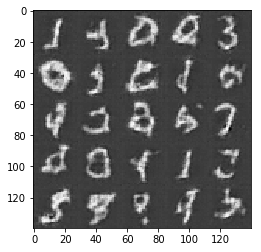

Epoch 1/2... Discriminator Loss: 0.2466... Generator Loss: 2.0818
Epoch 1/2... Discriminator Loss: 1.5065... Generator Loss: 0.3154
Epoch 1/2... Discriminator Loss: 0.2575... Generator Loss: 1.8078


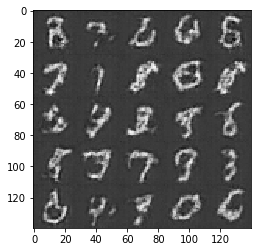

Epoch 1/2... Discriminator Loss: 0.3777... Generator Loss: 1.4236
Epoch 1/2... Discriminator Loss: 0.1331... Generator Loss: 2.8328
Epoch 1/2... Discriminator Loss: 1.3872... Generator Loss: 0.3653


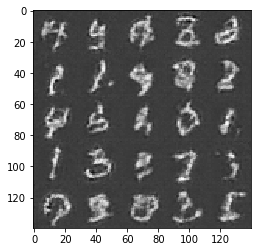

Epoch 1/2... Discriminator Loss: 0.6688... Generator Loss: 1.1991
Epoch 1/2... Discriminator Loss: 1.6038... Generator Loss: 0.3209
Epoch 1/2... Discriminator Loss: 0.3037... Generator Loss: 1.7126


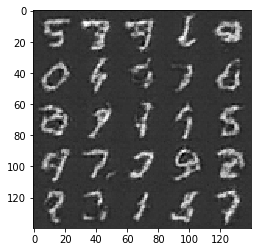

Epoch 1/2... Discriminator Loss: 0.4761... Generator Loss: 1.2825
Epoch 1/2... Discriminator Loss: 0.3349... Generator Loss: 1.6503
Epoch 1/2... Discriminator Loss: 0.1214... Generator Loss: 2.8810


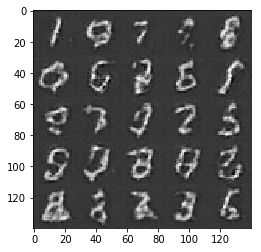

Epoch 1/2... Discriminator Loss: 0.1782... Generator Loss: 2.5994
Epoch 1/2... Discriminator Loss: 0.0954... Generator Loss: 3.1418
Epoch 1/2... Discriminator Loss: 0.1824... Generator Loss: 3.2318


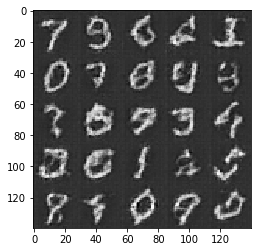

Epoch 1/2... Discriminator Loss: 0.6747... Generator Loss: 1.6804
Epoch 1/2... Discriminator Loss: 0.5440... Generator Loss: 1.2265
Epoch 1/2... Discriminator Loss: 0.3892... Generator Loss: 2.6993


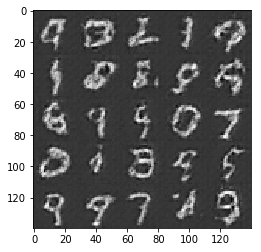

Epoch 1/2... Discriminator Loss: 0.2085... Generator Loss: 2.3186
Epoch 1/2... Discriminator Loss: 0.3698... Generator Loss: 1.5233
Epoch 1/2... Discriminator Loss: 0.5873... Generator Loss: 4.9586


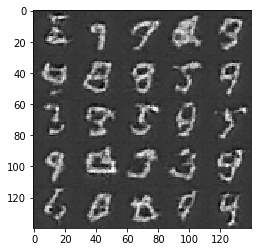

Epoch 1/2... Discriminator Loss: 0.2695... Generator Loss: 1.7421
Epoch 1/2... Discriminator Loss: 0.4377... Generator Loss: 1.3292
Epoch 1/2... Discriminator Loss: 0.1428... Generator Loss: 2.5106


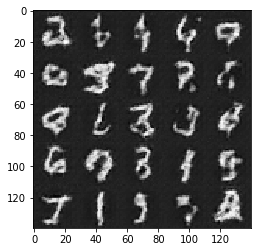

Epoch 1/2... Discriminator Loss: 0.1854... Generator Loss: 2.1511
Epoch 1/2... Discriminator Loss: 0.3278... Generator Loss: 1.5148
Epoch 1/2... Discriminator Loss: 0.0718... Generator Loss: 3.3322


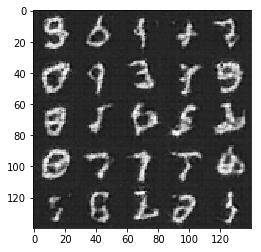

Epoch 1/2... Discriminator Loss: 0.1060... Generator Loss: 2.9328
Epoch 1/2... Discriminator Loss: 0.1885... Generator Loss: 2.0034
Epoch 1/2... Discriminator Loss: 0.1168... Generator Loss: 2.7037


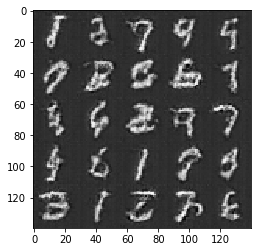

Epoch 1/2... Discriminator Loss: 0.0543... Generator Loss: 5.0203
Epoch 1/2... Discriminator Loss: 2.2521... Generator Loss: 0.1781
Epoch 1/2... Discriminator Loss: 0.4704... Generator Loss: 1.2478


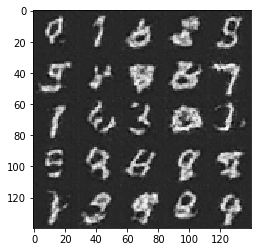

Epoch 1/2... Discriminator Loss: 0.2966... Generator Loss: 2.2705
Epoch 1/2... Discriminator Loss: 0.2538... Generator Loss: 1.8405
Epoch 1/2... Discriminator Loss: 0.1535... Generator Loss: 2.3065


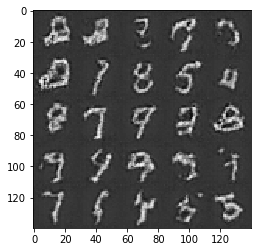

Epoch 1/2... Discriminator Loss: 2.6819... Generator Loss: 0.1297
Epoch 1/2... Discriminator Loss: 0.2939... Generator Loss: 1.9010
Epoch 1/2... Discriminator Loss: 0.7625... Generator Loss: 1.5398


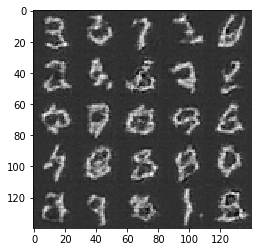

Epoch 1/2... Discriminator Loss: 0.9772... Generator Loss: 0.7801
Epoch 1/2... Discriminator Loss: 0.8364... Generator Loss: 1.6548
Epoch 1/2... Discriminator Loss: 0.8645... Generator Loss: 2.4151


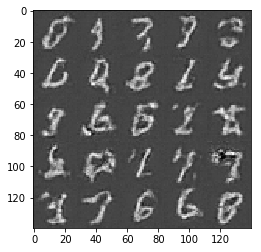

Epoch 1/2... Discriminator Loss: 1.3096... Generator Loss: 0.4048
Epoch 1/2... Discriminator Loss: 1.0710... Generator Loss: 3.2369
Epoch 1/2... Discriminator Loss: 0.3656... Generator Loss: 1.7441


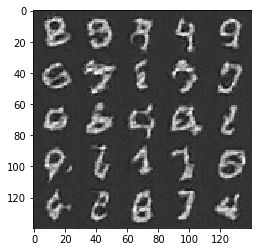

Epoch 1/2... Discriminator Loss: 0.3670... Generator Loss: 1.6024


In [80]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0/1... Discriminator Loss: 0.0966... Generator Loss: 17.4424
Epoch 0/1... Discriminator Loss: 0.1537... Generator Loss: 18.6848
Epoch 0/1... Discriminator Loss: 0.6286... Generator Loss: 1.1519


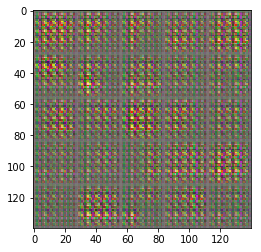

Epoch 0/1... Discriminator Loss: 0.3087... Generator Loss: 2.0831
Epoch 0/1... Discriminator Loss: 4.5723... Generator Loss: 0.3623
Epoch 0/1... Discriminator Loss: 2.5861... Generator Loss: 0.2020


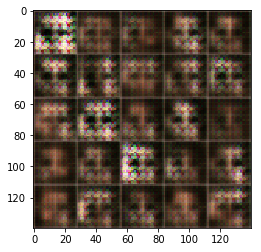

Epoch 0/1... Discriminator Loss: 1.5604... Generator Loss: 0.5531
Epoch 0/1... Discriminator Loss: 1.4777... Generator Loss: 0.7493
Epoch 0/1... Discriminator Loss: 1.4887... Generator Loss: 0.4794


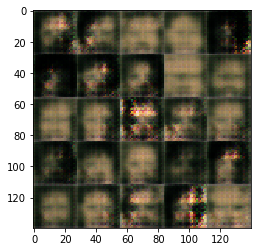

Epoch 0/1... Discriminator Loss: 3.0595... Generator Loss: 0.0809
Epoch 0/1... Discriminator Loss: 2.4813... Generator Loss: 0.1394
Epoch 0/1... Discriminator Loss: 0.8573... Generator Loss: 1.2316


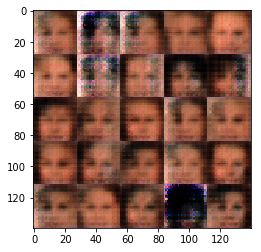

Epoch 0/1... Discriminator Loss: 1.4452... Generator Loss: 0.5419
Epoch 0/1... Discriminator Loss: 0.7553... Generator Loss: 0.9595
Epoch 0/1... Discriminator Loss: 1.2028... Generator Loss: 0.8691


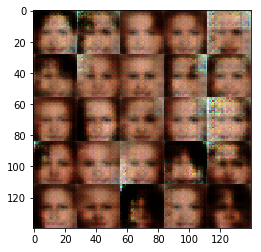

Epoch 0/1... Discriminator Loss: 0.7736... Generator Loss: 1.3243
Epoch 0/1... Discriminator Loss: 0.6347... Generator Loss: 1.1631
Epoch 0/1... Discriminator Loss: 0.6224... Generator Loss: 0.9649


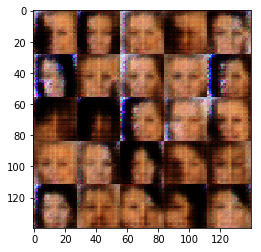

Epoch 0/1... Discriminator Loss: 0.5614... Generator Loss: 1.5364
Epoch 0/1... Discriminator Loss: 0.6037... Generator Loss: 2.3099
Epoch 0/1... Discriminator Loss: 0.6650... Generator Loss: 0.9942


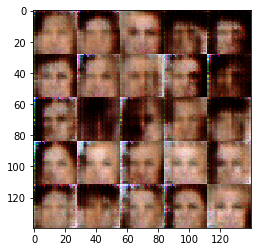

Epoch 0/1... Discriminator Loss: 0.4471... Generator Loss: 2.2468
Epoch 0/1... Discriminator Loss: 0.9130... Generator Loss: 1.9355
Epoch 0/1... Discriminator Loss: 0.9573... Generator Loss: 0.7166


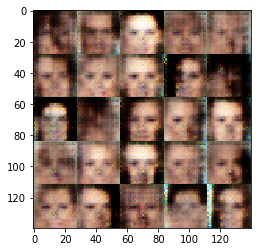

Epoch 0/1... Discriminator Loss: 2.6660... Generator Loss: 0.1079
Epoch 0/1... Discriminator Loss: 2.3714... Generator Loss: 6.1475
Epoch 0/1... Discriminator Loss: 0.4936... Generator Loss: 1.4721


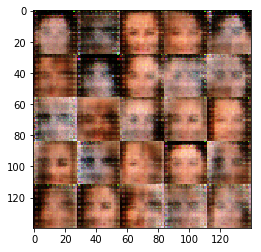

Epoch 0/1... Discriminator Loss: 0.2632... Generator Loss: 1.7801
Epoch 0/1... Discriminator Loss: 0.5211... Generator Loss: 1.2926
Epoch 0/1... Discriminator Loss: 0.7426... Generator Loss: 2.3133


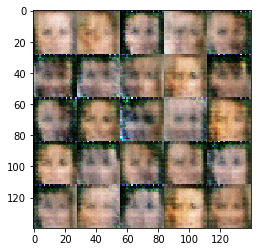

Epoch 0/1... Discriminator Loss: 0.1145... Generator Loss: 2.6043
Epoch 0/1... Discriminator Loss: 0.5689... Generator Loss: 1.4919
Epoch 0/1... Discriminator Loss: 0.9524... Generator Loss: 0.7351


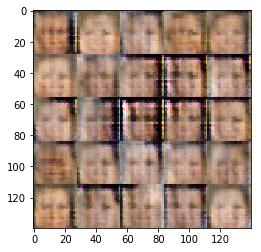

Epoch 0/1... Discriminator Loss: 0.7158... Generator Loss: 0.9206
Epoch 0/1... Discriminator Loss: 0.5275... Generator Loss: 1.2591
Epoch 0/1... Discriminator Loss: 1.1096... Generator Loss: 0.6159


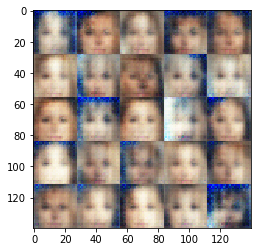

Epoch 0/1... Discriminator Loss: 1.0647... Generator Loss: 2.4395
Epoch 0/1... Discriminator Loss: 0.4247... Generator Loss: 1.4105
Epoch 0/1... Discriminator Loss: 0.9566... Generator Loss: 0.8235


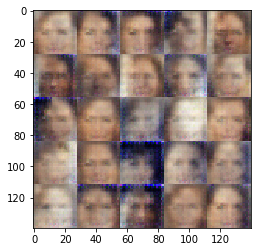

Epoch 0/1... Discriminator Loss: 0.9815... Generator Loss: 0.9111
Epoch 0/1... Discriminator Loss: 0.3269... Generator Loss: 2.0288
Epoch 0/1... Discriminator Loss: 0.6470... Generator Loss: 2.0187


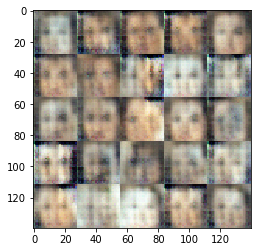

Epoch 0/1... Discriminator Loss: 0.4441... Generator Loss: 2.7721
Epoch 0/1... Discriminator Loss: 1.4541... Generator Loss: 3.4792
Epoch 0/1... Discriminator Loss: 1.9993... Generator Loss: 2.2139


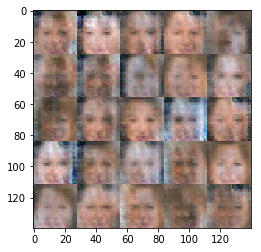

Epoch 0/1... Discriminator Loss: 1.4337... Generator Loss: 0.5345
Epoch 0/1... Discriminator Loss: 1.0708... Generator Loss: 0.8685
Epoch 0/1... Discriminator Loss: 0.6797... Generator Loss: 2.2962


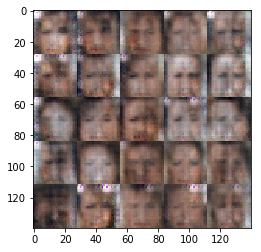

Epoch 0/1... Discriminator Loss: 1.2767... Generator Loss: 0.6237
Epoch 0/1... Discriminator Loss: 1.4005... Generator Loss: 0.5391
Epoch 0/1... Discriminator Loss: 1.1898... Generator Loss: 1.5523


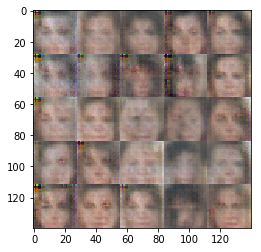

Epoch 0/1... Discriminator Loss: 1.4860... Generator Loss: 4.1255
Epoch 0/1... Discriminator Loss: 0.5328... Generator Loss: 1.5715
Epoch 0/1... Discriminator Loss: 0.8431... Generator Loss: 0.9530


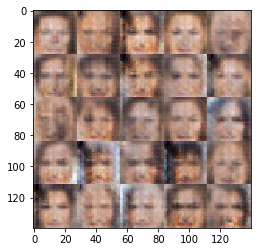

Epoch 0/1... Discriminator Loss: 1.1728... Generator Loss: 0.6750
Epoch 0/1... Discriminator Loss: 0.9370... Generator Loss: 3.9430
Epoch 0/1... Discriminator Loss: 0.4268... Generator Loss: 1.4378


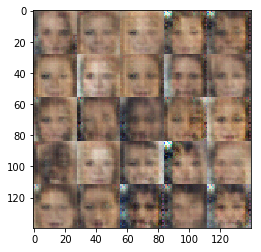

Epoch 0/1... Discriminator Loss: 0.9601... Generator Loss: 0.7712
Epoch 0/1... Discriminator Loss: 0.9073... Generator Loss: 0.9861
Epoch 0/1... Discriminator Loss: 0.4998... Generator Loss: 2.6364


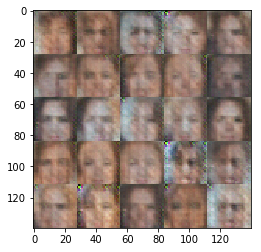

Epoch 0/1... Discriminator Loss: 0.3040... Generator Loss: 1.8525
Epoch 0/1... Discriminator Loss: 0.7495... Generator Loss: 0.9267
Epoch 0/1... Discriminator Loss: 2.4425... Generator Loss: 0.1242


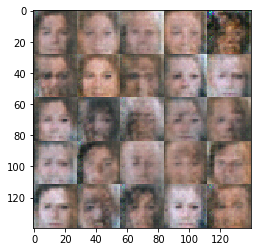

Epoch 0/1... Discriminator Loss: 1.1589... Generator Loss: 0.5210
Epoch 0/1... Discriminator Loss: 1.4774... Generator Loss: 0.3347
Epoch 0/1... Discriminator Loss: 1.3148... Generator Loss: 0.4461


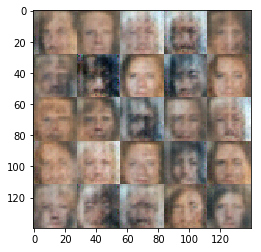

Epoch 0/1... Discriminator Loss: 0.2286... Generator Loss: 2.7409
Epoch 0/1... Discriminator Loss: 1.3614... Generator Loss: 0.7329
Epoch 0/1... Discriminator Loss: 1.6038... Generator Loss: 0.6808


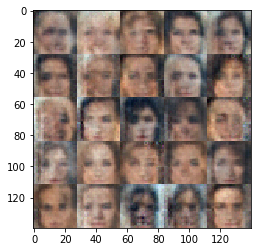

Epoch 0/1... Discriminator Loss: 1.5466... Generator Loss: 0.4154
Epoch 0/1... Discriminator Loss: 1.3349... Generator Loss: 0.8342
Epoch 0/1... Discriminator Loss: 1.2553... Generator Loss: 3.5750


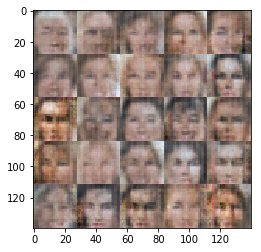

Epoch 0/1... Discriminator Loss: 1.2190... Generator Loss: 0.5373
Epoch 0/1... Discriminator Loss: 0.7561... Generator Loss: 1.9806
Epoch 0/1... Discriminator Loss: 1.9949... Generator Loss: 0.2131


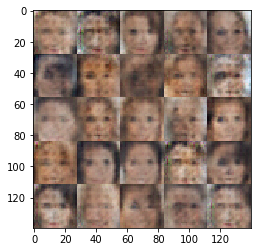

Epoch 0/1... Discriminator Loss: 1.1987... Generator Loss: 0.6145
Epoch 0/1... Discriminator Loss: 1.0372... Generator Loss: 3.1174
Epoch 0/1... Discriminator Loss: 1.2125... Generator Loss: 1.0747


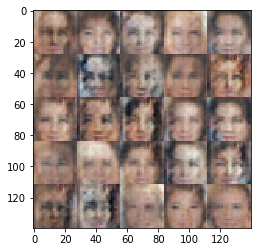

Epoch 0/1... Discriminator Loss: 1.2846... Generator Loss: 4.4756
Epoch 0/1... Discriminator Loss: 0.7296... Generator Loss: 1.2545
Epoch 0/1... Discriminator Loss: 0.9277... Generator Loss: 0.9010


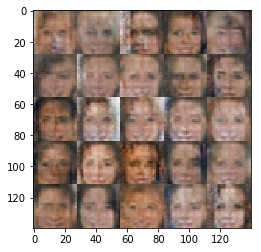

Epoch 0/1... Discriminator Loss: 1.8767... Generator Loss: 0.2296
Epoch 0/1... Discriminator Loss: 1.0950... Generator Loss: 1.4524
Epoch 0/1... Discriminator Loss: 1.1984... Generator Loss: 0.5352


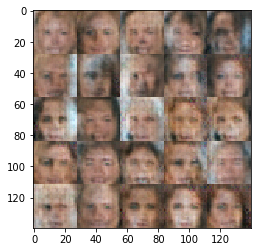

Epoch 0/1... Discriminator Loss: 0.6585... Generator Loss: 1.6750
Epoch 0/1... Discriminator Loss: 1.2269... Generator Loss: 0.5986
Epoch 0/1... Discriminator Loss: 0.6922... Generator Loss: 2.4954


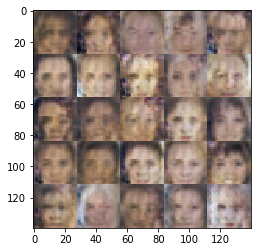

Epoch 0/1... Discriminator Loss: 1.3364... Generator Loss: 0.8388
Epoch 0/1... Discriminator Loss: 1.2954... Generator Loss: 1.5385
Epoch 0/1... Discriminator Loss: 0.8269... Generator Loss: 1.9848


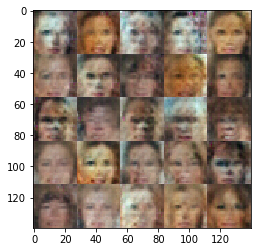

Epoch 0/1... Discriminator Loss: 0.5542... Generator Loss: 1.3304
Epoch 0/1... Discriminator Loss: 1.8022... Generator Loss: 2.2740
Epoch 0/1... Discriminator Loss: 0.9107... Generator Loss: 1.3538


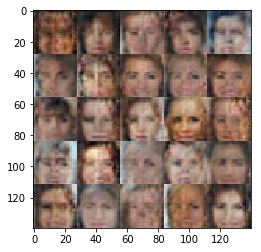

Epoch 0/1... Discriminator Loss: 0.8379... Generator Loss: 1.9346
Epoch 0/1... Discriminator Loss: 1.3659... Generator Loss: 0.3658
Epoch 0/1... Discriminator Loss: 1.6555... Generator Loss: 0.3251


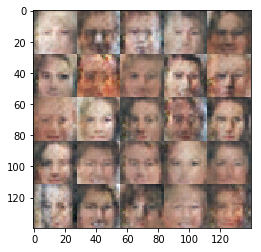

Epoch 0/1... Discriminator Loss: 1.5592... Generator Loss: 0.3504
Epoch 0/1... Discriminator Loss: 1.2374... Generator Loss: 0.5895
Epoch 0/1... Discriminator Loss: 1.2559... Generator Loss: 3.4700


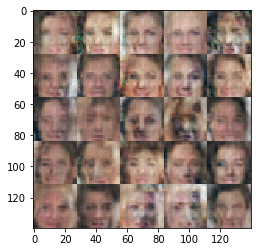

Epoch 0/1... Discriminator Loss: 0.6479... Generator Loss: 1.7363
Epoch 0/1... Discriminator Loss: 1.4056... Generator Loss: 1.6321
Epoch 0/1... Discriminator Loss: 1.6364... Generator Loss: 0.3306


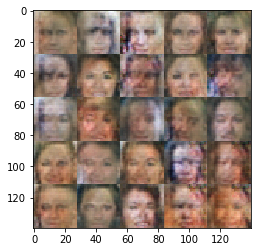

Epoch 0/1... Discriminator Loss: 0.9373... Generator Loss: 1.0848
Epoch 0/1... Discriminator Loss: 0.5944... Generator Loss: 1.5712
Epoch 0/1... Discriminator Loss: 1.6429... Generator Loss: 0.3143


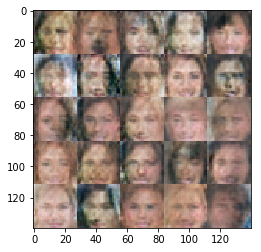

Epoch 0/1... Discriminator Loss: 0.7451... Generator Loss: 3.5844
Epoch 0/1... Discriminator Loss: 1.2982... Generator Loss: 0.6837
Epoch 0/1... Discriminator Loss: 1.1656... Generator Loss: 0.7825


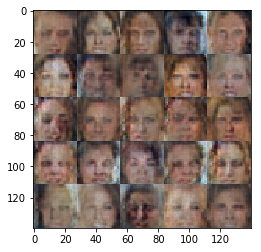

Epoch 0/1... Discriminator Loss: 1.2772... Generator Loss: 0.5325
Epoch 0/1... Discriminator Loss: 1.3268... Generator Loss: 0.9107
Epoch 0/1... Discriminator Loss: 1.1811... Generator Loss: 0.8554


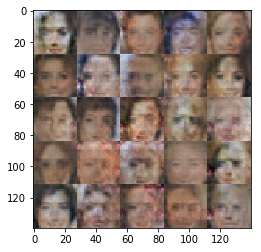

Epoch 0/1... Discriminator Loss: 1.1474... Generator Loss: 1.0379
Epoch 0/1... Discriminator Loss: 1.0557... Generator Loss: 1.0658
Epoch 0/1... Discriminator Loss: 1.1010... Generator Loss: 0.9906


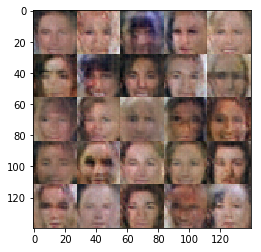

Epoch 0/1... Discriminator Loss: 1.2293... Generator Loss: 0.6905
Epoch 0/1... Discriminator Loss: 1.2492... Generator Loss: 0.6447
Epoch 0/1... Discriminator Loss: 1.2925... Generator Loss: 1.5022


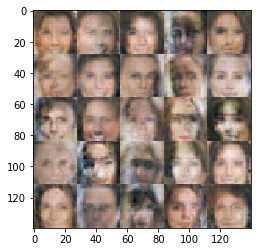

Epoch 0/1... Discriminator Loss: 1.2574... Generator Loss: 0.7339
Epoch 0/1... Discriminator Loss: 1.4529... Generator Loss: 0.6310
Epoch 0/1... Discriminator Loss: 1.1624... Generator Loss: 0.5729


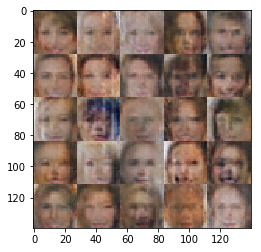

Epoch 0/1... Discriminator Loss: 1.1899... Generator Loss: 0.6824
Epoch 0/1... Discriminator Loss: 1.0792... Generator Loss: 1.1164
Epoch 0/1... Discriminator Loss: 1.4538... Generator Loss: 0.4362


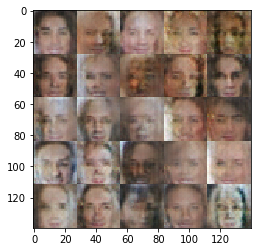

Epoch 0/1... Discriminator Loss: 1.4787... Generator Loss: 0.3965
Epoch 0/1... Discriminator Loss: 1.1994... Generator Loss: 0.7639
Epoch 0/1... Discriminator Loss: 1.1428... Generator Loss: 0.9048


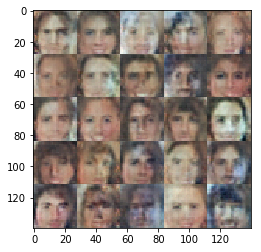

Epoch 0/1... Discriminator Loss: 1.2673... Generator Loss: 0.5203
Epoch 0/1... Discriminator Loss: 1.3108... Generator Loss: 0.5932
Epoch 0/1... Discriminator Loss: 1.0781... Generator Loss: 1.0191


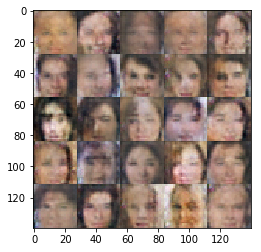

Epoch 0/1... Discriminator Loss: 1.0210... Generator Loss: 1.2429
Epoch 0/1... Discriminator Loss: 1.4003... Generator Loss: 0.6323
Epoch 0/1... Discriminator Loss: 1.2033... Generator Loss: 0.9459


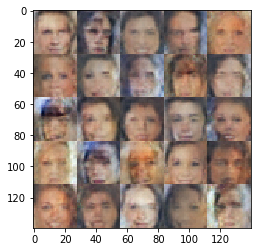

Epoch 0/1... Discriminator Loss: 1.1528... Generator Loss: 0.7607
Epoch 0/1... Discriminator Loss: 1.2107... Generator Loss: 0.7218
Epoch 0/1... Discriminator Loss: 1.0474... Generator Loss: 0.7193


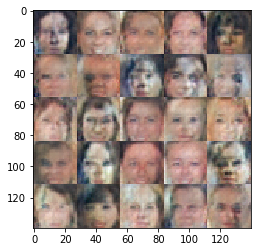

Epoch 0/1... Discriminator Loss: 1.2450... Generator Loss: 1.4152
Epoch 0/1... Discriminator Loss: 1.1995... Generator Loss: 0.7681
Epoch 0/1... Discriminator Loss: 1.2316... Generator Loss: 0.4886


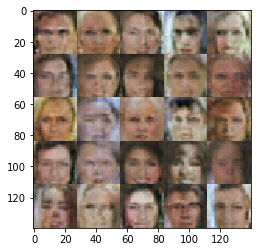

Epoch 0/1... Discriminator Loss: 1.2338... Generator Loss: 1.1422
Epoch 0/1... Discriminator Loss: 1.2169... Generator Loss: 0.6038
Epoch 0/1... Discriminator Loss: 1.2184... Generator Loss: 1.5278


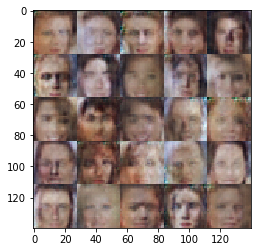

Epoch 0/1... Discriminator Loss: 1.3264... Generator Loss: 0.4631
Epoch 0/1... Discriminator Loss: 1.2977... Generator Loss: 0.7018
Epoch 0/1... Discriminator Loss: 1.2519... Generator Loss: 0.7216


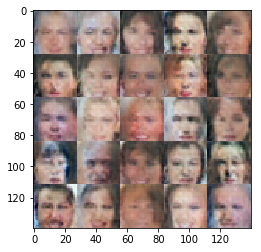

Epoch 0/1... Discriminator Loss: 1.3117... Generator Loss: 0.8961
Epoch 0/1... Discriminator Loss: 1.4581... Generator Loss: 1.6224
Epoch 0/1... Discriminator Loss: 1.1911... Generator Loss: 0.7342


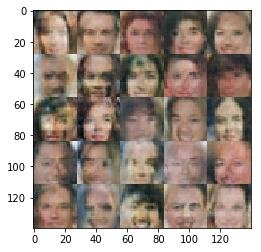

Epoch 0/1... Discriminator Loss: 1.5961... Generator Loss: 0.3437
Epoch 0/1... Discriminator Loss: 1.3119... Generator Loss: 0.6629
Epoch 0/1... Discriminator Loss: 1.7142... Generator Loss: 0.2894


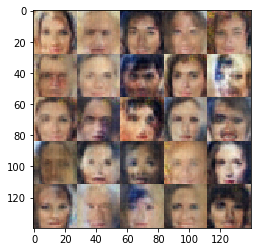

Epoch 0/1... Discriminator Loss: 1.2357... Generator Loss: 1.1877
Epoch 0/1... Discriminator Loss: 1.0988... Generator Loss: 1.0180
Epoch 0/1... Discriminator Loss: 1.2811... Generator Loss: 0.5101


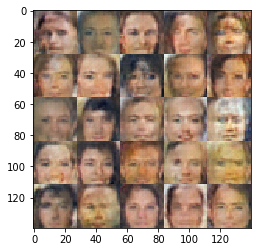

Epoch 0/1... Discriminator Loss: 1.0560... Generator Loss: 0.9837
Epoch 0/1... Discriminator Loss: 1.2761... Generator Loss: 0.5786
Epoch 0/1... Discriminator Loss: 1.1340... Generator Loss: 0.9463


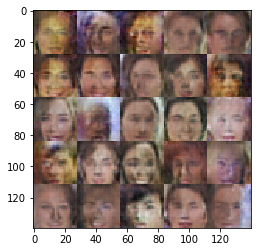

Epoch 0/1... Discriminator Loss: 1.0929... Generator Loss: 1.1280
Epoch 0/1... Discriminator Loss: 1.3034... Generator Loss: 0.5483
Epoch 0/1... Discriminator Loss: 1.1352... Generator Loss: 0.7106


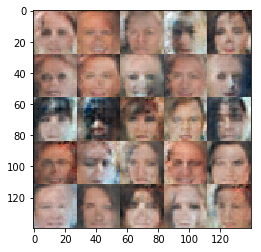

Epoch 0/1... Discriminator Loss: 1.4815... Generator Loss: 1.8997
Epoch 0/1... Discriminator Loss: 1.3008... Generator Loss: 0.5744
Epoch 0/1... Discriminator Loss: 1.3247... Generator Loss: 1.1250


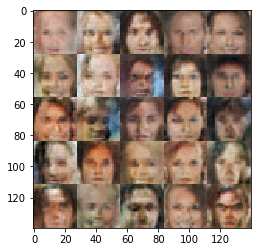

Epoch 0/1... Discriminator Loss: 1.1980... Generator Loss: 0.9990
Epoch 0/1... Discriminator Loss: 1.4119... Generator Loss: 0.4422
Epoch 0/1... Discriminator Loss: 1.3969... Generator Loss: 0.4168


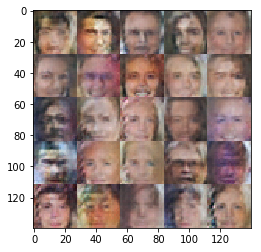

Epoch 0/1... Discriminator Loss: 1.5011... Generator Loss: 0.4662
Epoch 0/1... Discriminator Loss: 1.2388... Generator Loss: 1.1099
Epoch 0/1... Discriminator Loss: 1.3631... Generator Loss: 0.8841


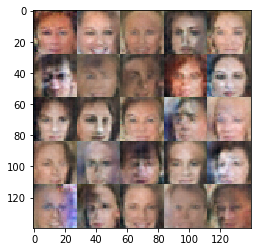

Epoch 0/1... Discriminator Loss: 1.1898... Generator Loss: 0.7323
Epoch 0/1... Discriminator Loss: 1.3609... Generator Loss: 0.5261
Epoch 0/1... Discriminator Loss: 1.2031... Generator Loss: 0.5325


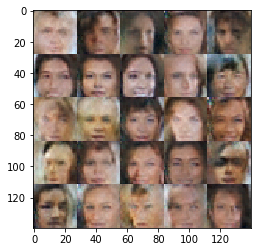

Epoch 0/1... Discriminator Loss: 1.2277... Generator Loss: 0.7793
Epoch 0/1... Discriminator Loss: 1.1775... Generator Loss: 1.0093
Epoch 0/1... Discriminator Loss: 1.1458... Generator Loss: 1.1645


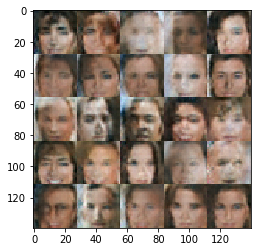

Epoch 0/1... Discriminator Loss: 1.1536... Generator Loss: 0.6223
Epoch 0/1... Discriminator Loss: 1.2074... Generator Loss: 1.0196
Epoch 0/1... Discriminator Loss: 1.1298... Generator Loss: 1.0421


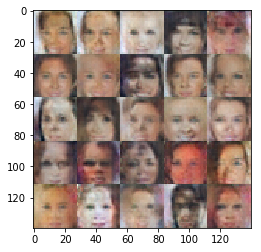

Epoch 0/1... Discriminator Loss: 1.2837... Generator Loss: 0.8809
Epoch 0/1... Discriminator Loss: 1.1868... Generator Loss: 0.6802
Epoch 0/1... Discriminator Loss: 1.2714... Generator Loss: 0.6322


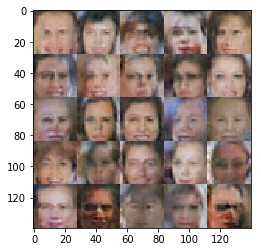

Epoch 0/1... Discriminator Loss: 1.0614... Generator Loss: 1.0538
Epoch 0/1... Discriminator Loss: 1.2377... Generator Loss: 0.6864
Epoch 0/1... Discriminator Loss: 1.2250... Generator Loss: 0.8615


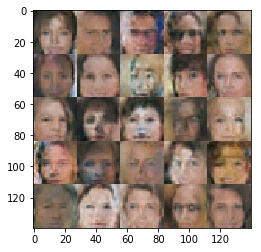

Epoch 0/1... Discriminator Loss: 1.3285... Generator Loss: 0.4955
Epoch 0/1... Discriminator Loss: 1.2572... Generator Loss: 0.5564
Epoch 0/1... Discriminator Loss: 1.2427... Generator Loss: 0.6185


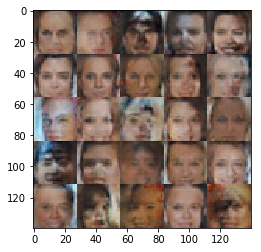

Epoch 0/1... Discriminator Loss: 1.2991... Generator Loss: 0.6245
Epoch 0/1... Discriminator Loss: 1.6574... Generator Loss: 0.2710
Epoch 0/1... Discriminator Loss: 1.2011... Generator Loss: 0.9293


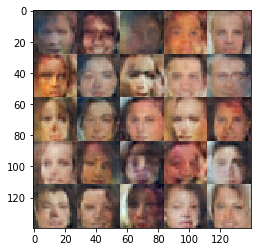

Epoch 0/1... Discriminator Loss: 1.4460... Generator Loss: 0.7120
Epoch 0/1... Discriminator Loss: 1.2187... Generator Loss: 0.8476
Epoch 0/1... Discriminator Loss: 1.3228... Generator Loss: 0.5304


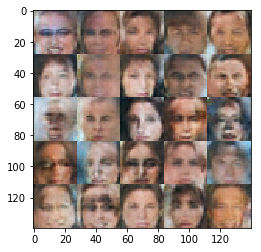

Epoch 0/1... Discriminator Loss: 1.3404... Generator Loss: 0.4658
Epoch 0/1... Discriminator Loss: 1.2195... Generator Loss: 1.1801
Epoch 0/1... Discriminator Loss: 1.3774... Generator Loss: 0.5905


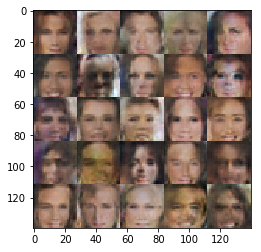

Epoch 0/1... Discriminator Loss: 1.3327... Generator Loss: 1.2436
Epoch 0/1... Discriminator Loss: 1.2504... Generator Loss: 0.6421
Epoch 0/1... Discriminator Loss: 1.1625... Generator Loss: 1.1797


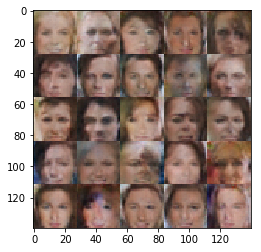

Epoch 0/1... Discriminator Loss: 1.3189... Generator Loss: 0.9661
Epoch 0/1... Discriminator Loss: 1.2573... Generator Loss: 0.5907
Epoch 0/1... Discriminator Loss: 1.2593... Generator Loss: 0.5938


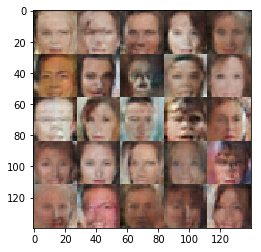

Epoch 0/1... Discriminator Loss: 1.3972... Generator Loss: 0.6482
Epoch 0/1... Discriminator Loss: 1.4629... Generator Loss: 0.8907
Epoch 0/1... Discriminator Loss: 1.5043... Generator Loss: 0.3403


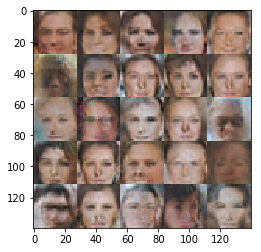

Epoch 0/1... Discriminator Loss: 1.1878... Generator Loss: 0.7043
Epoch 0/1... Discriminator Loss: 1.2530... Generator Loss: 0.9238
Epoch 0/1... Discriminator Loss: 1.4121... Generator Loss: 0.5201


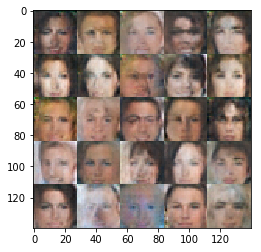

Epoch 0/1... Discriminator Loss: 1.1832... Generator Loss: 1.0838
Epoch 0/1... Discriminator Loss: 1.2012... Generator Loss: 0.9292
Epoch 0/1... Discriminator Loss: 1.2442... Generator Loss: 0.7633


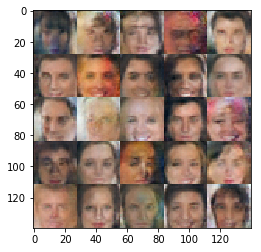

Epoch 0/1... Discriminator Loss: 1.2526... Generator Loss: 0.6591
Epoch 0/1... Discriminator Loss: 1.1791... Generator Loss: 0.7450
Epoch 0/1... Discriminator Loss: 1.3249... Generator Loss: 0.5083


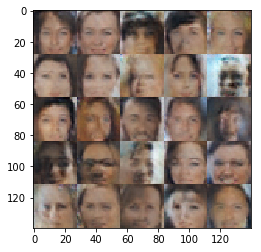

Epoch 0/1... Discriminator Loss: 1.4559... Generator Loss: 0.3893
Epoch 0/1... Discriminator Loss: 1.1717... Generator Loss: 0.8061
Epoch 0/1... Discriminator Loss: 1.3060... Generator Loss: 0.4438


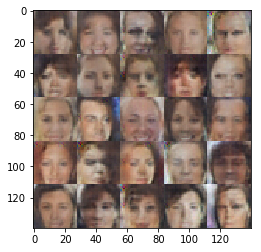

Epoch 0/1... Discriminator Loss: 0.8418... Generator Loss: 0.8578
Epoch 0/1... Discriminator Loss: 0.7487... Generator Loss: 1.9848
Epoch 0/1... Discriminator Loss: 0.8908... Generator Loss: 1.4048


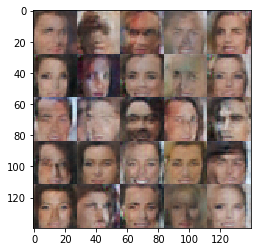

Epoch 0/1... Discriminator Loss: 1.7879... Generator Loss: 0.2240
Epoch 0/1... Discriminator Loss: 1.2999... Generator Loss: 0.5493
Epoch 0/1... Discriminator Loss: 1.0741... Generator Loss: 0.6878


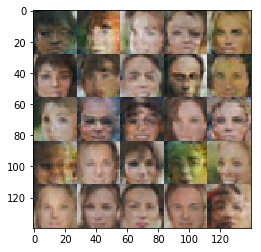

Epoch 0/1... Discriminator Loss: 1.2783... Generator Loss: 0.7911
Epoch 0/1... Discriminator Loss: 1.3055... Generator Loss: 0.9361
Epoch 0/1... Discriminator Loss: 1.4222... Generator Loss: 0.7808


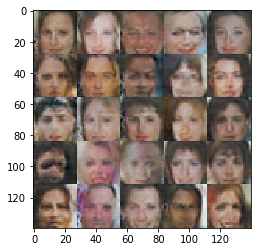

Epoch 0/1... Discriminator Loss: 1.2940... Generator Loss: 0.4568
Epoch 0/1... Discriminator Loss: 1.1259... Generator Loss: 0.6803
Epoch 0/1... Discriminator Loss: 1.1779... Generator Loss: 0.7057


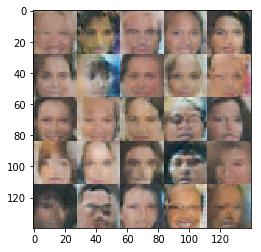

Epoch 0/1... Discriminator Loss: 1.2123... Generator Loss: 0.8073
Epoch 0/1... Discriminator Loss: 1.6564... Generator Loss: 1.3073
Epoch 0/1... Discriminator Loss: 1.1737... Generator Loss: 0.6484


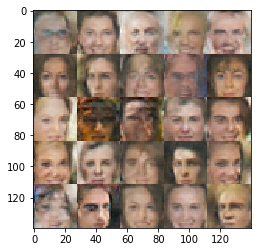

Epoch 0/1... Discriminator Loss: 1.3074... Generator Loss: 1.0274
Epoch 0/1... Discriminator Loss: 1.1443... Generator Loss: 0.8034
Epoch 0/1... Discriminator Loss: 1.3655... Generator Loss: 0.4723


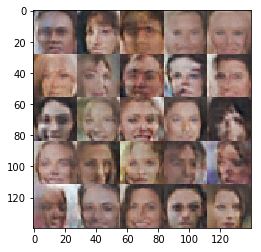

Epoch 0/1... Discriminator Loss: 1.1701... Generator Loss: 0.6534
Epoch 0/1... Discriminator Loss: 1.1531... Generator Loss: 1.1926
Epoch 0/1... Discriminator Loss: 1.2203... Generator Loss: 0.6849


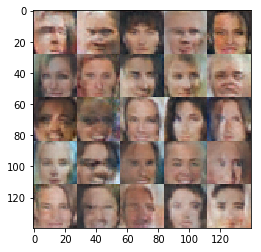

Epoch 0/1... Discriminator Loss: 1.1985... Generator Loss: 0.5702
Epoch 0/1... Discriminator Loss: 1.2535... Generator Loss: 0.5178
Epoch 0/1... Discriminator Loss: 1.4380... Generator Loss: 0.3924


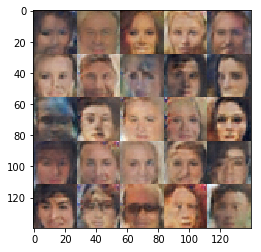

Epoch 0/1... Discriminator Loss: 1.7809... Generator Loss: 1.7519
Epoch 0/1... Discriminator Loss: 1.3230... Generator Loss: 0.8321
Epoch 0/1... Discriminator Loss: 1.1258... Generator Loss: 1.1609


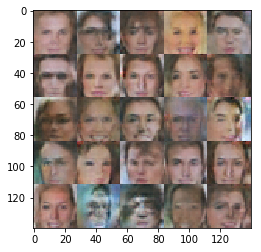

Epoch 0/1... Discriminator Loss: 1.2587... Generator Loss: 0.8795
Epoch 0/1... Discriminator Loss: 1.1238... Generator Loss: 0.6609
Epoch 0/1... Discriminator Loss: 1.4009... Generator Loss: 0.4630


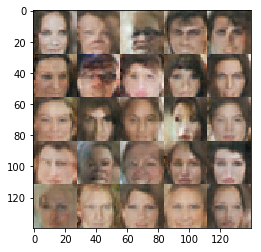

Epoch 0/1... Discriminator Loss: 1.1841... Generator Loss: 0.8629
Epoch 0/1... Discriminator Loss: 1.3697... Generator Loss: 0.4986
Epoch 0/1... Discriminator Loss: 1.2216... Generator Loss: 1.3653


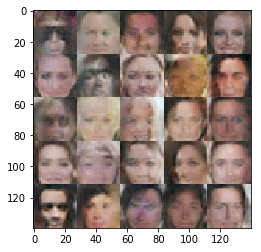

Epoch 0/1... Discriminator Loss: 1.1868... Generator Loss: 0.9484
Epoch 0/1... Discriminator Loss: 1.1937... Generator Loss: 0.9868
Epoch 0/1... Discriminator Loss: 1.2939... Generator Loss: 0.5313


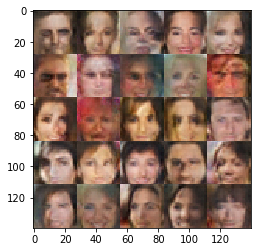

Epoch 0/1... Discriminator Loss: 1.3007... Generator Loss: 0.6595
Epoch 0/1... Discriminator Loss: 1.0549... Generator Loss: 0.7782
Epoch 0/1... Discriminator Loss: 1.2769... Generator Loss: 0.9719


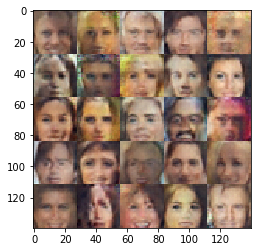

Epoch 0/1... Discriminator Loss: 1.3184... Generator Loss: 0.9210
Epoch 0/1... Discriminator Loss: 1.2389... Generator Loss: 0.5954
Epoch 0/1... Discriminator Loss: 1.1301... Generator Loss: 1.0225


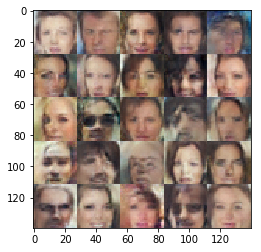

Epoch 0/1... Discriminator Loss: 1.2552... Generator Loss: 0.5119
Epoch 0/1... Discriminator Loss: 1.3066... Generator Loss: 0.6539
Epoch 0/1... Discriminator Loss: 1.2625... Generator Loss: 0.8994


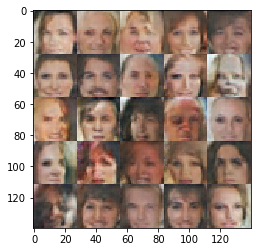

Epoch 0/1... Discriminator Loss: 1.4072... Generator Loss: 0.9600
Epoch 0/1... Discriminator Loss: 1.2287... Generator Loss: 0.6556
Epoch 0/1... Discriminator Loss: 1.3460... Generator Loss: 0.4804


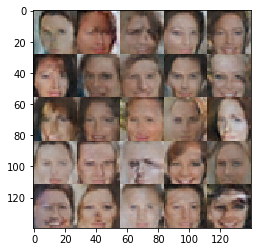

Epoch 0/1... Discriminator Loss: 1.2271... Generator Loss: 0.8139
Epoch 0/1... Discriminator Loss: 1.1219... Generator Loss: 1.1253
Epoch 0/1... Discriminator Loss: 1.2800... Generator Loss: 0.6768


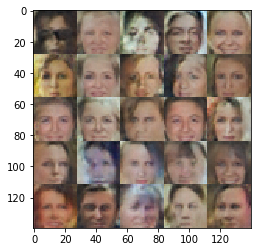

Epoch 0/1... Discriminator Loss: 1.3373... Generator Loss: 1.1036
Epoch 0/1... Discriminator Loss: 1.1979... Generator Loss: 0.5911
Epoch 0/1... Discriminator Loss: 1.2241... Generator Loss: 0.6522


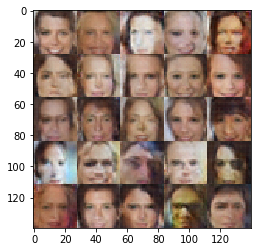

Epoch 0/1... Discriminator Loss: 1.6525... Generator Loss: 0.3040
Epoch 0/1... Discriminator Loss: 1.4445... Generator Loss: 0.6261
Epoch 0/1... Discriminator Loss: 1.4762... Generator Loss: 0.4619


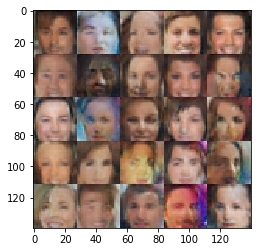

Epoch 0/1... Discriminator Loss: 1.1447... Generator Loss: 0.7739
Epoch 0/1... Discriminator Loss: 1.2557... Generator Loss: 1.0230
Epoch 0/1... Discriminator Loss: 1.2918... Generator Loss: 0.8107


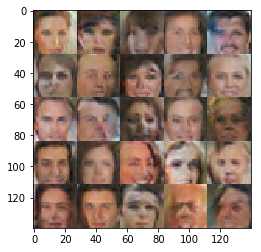

Epoch 0/1... Discriminator Loss: 1.2622... Generator Loss: 0.7354
Epoch 0/1... Discriminator Loss: 1.3188... Generator Loss: 0.9485
Epoch 0/1... Discriminator Loss: 1.1726... Generator Loss: 0.7900


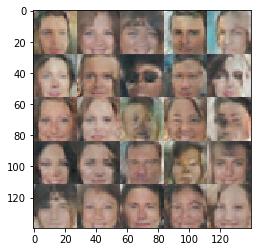

Epoch 0/1... Discriminator Loss: 1.1995... Generator Loss: 0.6002
Epoch 0/1... Discriminator Loss: 1.3518... Generator Loss: 0.7681
Epoch 0/1... Discriminator Loss: 1.2089... Generator Loss: 0.6765


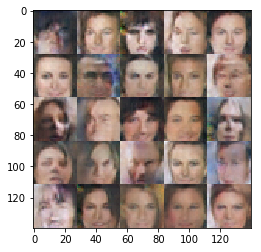

Epoch 0/1... Discriminator Loss: 1.1535... Generator Loss: 1.0856
Epoch 0/1... Discriminator Loss: 1.4814... Generator Loss: 1.6188
Epoch 0/1... Discriminator Loss: 1.2082... Generator Loss: 1.0600


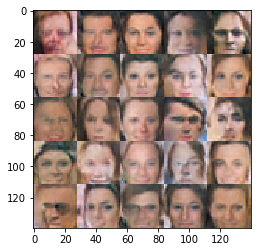

Epoch 0/1... Discriminator Loss: 1.2445... Generator Loss: 0.6015
Epoch 0/1... Discriminator Loss: 1.2712... Generator Loss: 0.5804
Epoch 0/1... Discriminator Loss: 1.3229... Generator Loss: 0.4886


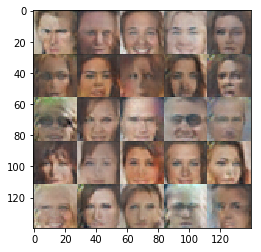

Epoch 0/1... Discriminator Loss: 1.3027... Generator Loss: 0.5610
Epoch 0/1... Discriminator Loss: 1.4978... Generator Loss: 0.3692
Epoch 0/1... Discriminator Loss: 1.2822... Generator Loss: 0.5707


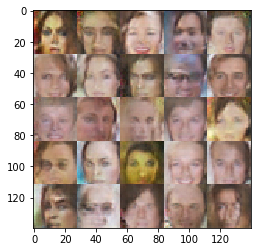

Epoch 0/1... Discriminator Loss: 1.1794... Generator Loss: 0.9513
Epoch 0/1... Discriminator Loss: 1.1440... Generator Loss: 0.8290
Epoch 0/1... Discriminator Loss: 1.5615... Generator Loss: 1.1621


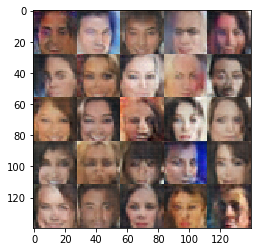

Epoch 0/1... Discriminator Loss: 1.2735... Generator Loss: 0.5215
Epoch 0/1... Discriminator Loss: 1.0470... Generator Loss: 0.6722
Epoch 0/1... Discriminator Loss: 1.1214... Generator Loss: 0.6442


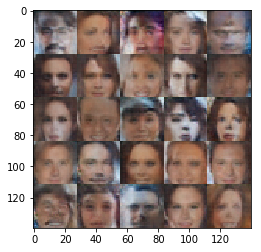

Epoch 0/1... Discriminator Loss: 1.2022... Generator Loss: 0.7794
Epoch 0/1... Discriminator Loss: 1.3723... Generator Loss: 0.6905
Epoch 0/1... Discriminator Loss: 1.3049... Generator Loss: 0.6163


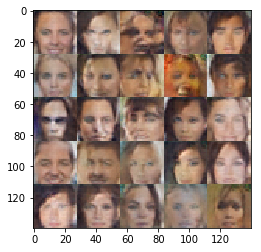

Epoch 0/1... Discriminator Loss: 1.3329... Generator Loss: 0.7084
Epoch 0/1... Discriminator Loss: 1.3913... Generator Loss: 0.4395
Epoch 0/1... Discriminator Loss: 1.1875... Generator Loss: 1.0947


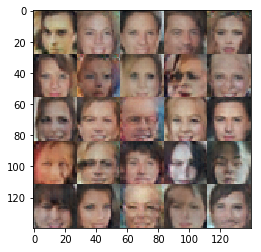

Epoch 0/1... Discriminator Loss: 1.8052... Generator Loss: 0.2751
Epoch 0/1... Discriminator Loss: 1.0383... Generator Loss: 0.8062
Epoch 0/1... Discriminator Loss: 1.2989... Generator Loss: 0.7453


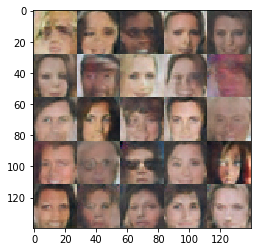

Epoch 0/1... Discriminator Loss: 1.1200... Generator Loss: 1.0765
Epoch 0/1... Discriminator Loss: 1.1759... Generator Loss: 0.8293
Epoch 0/1... Discriminator Loss: 1.1572... Generator Loss: 0.9396


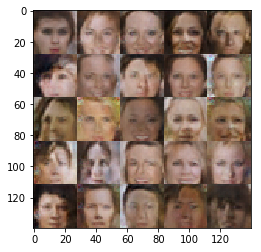

Epoch 0/1... Discriminator Loss: 1.3668... Generator Loss: 0.5431
Epoch 0/1... Discriminator Loss: 1.4137... Generator Loss: 0.9754
Epoch 0/1... Discriminator Loss: 1.1165... Generator Loss: 0.7237


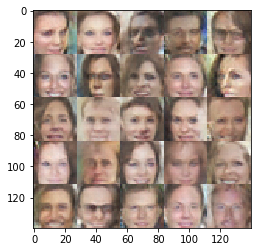

Epoch 0/1... Discriminator Loss: 1.3769... Generator Loss: 0.4221
Epoch 0/1... Discriminator Loss: 1.3150... Generator Loss: 0.8378
Epoch 0/1... Discriminator Loss: 1.3155... Generator Loss: 0.5827


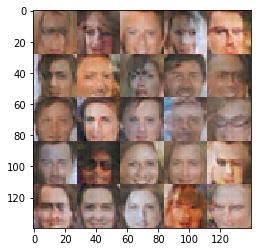

Epoch 0/1... Discriminator Loss: 1.3247... Generator Loss: 0.8097


In [81]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.